# Introduction

This notebook is an example of basic data science using very popular Python packages `pandas`, `seaborn`, and `scikit-learn`.

The dataset for this example is a study on diabeties of females of Pima deceent. The data has been used for many years to illistrate predictive modeling and data science (even before it was called data science)


To use this notebook you can execute each cell and see the results.
Feel free to modify the code, or insert new cells and try to make changes.
This notebook should be viewed as a playground for you to experiment with no concern for having to clean up your mess when your done. 

## Setup

As a best practice I load all the neede packages at the top of the notebook. My main purpose is that I can tell if I have everthing installed before I begin.
If you don't have one of these packages installed, the easiest way to debug is to copy the error and paste in into your perferred browser. I would select the first search engine hit from **stackoverflow**. 
Welcome to coding in the modern era :)

In [12]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas_profiling

from sklearn import preprocessing
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, confusion_matrix
from scikitplot.metrics import plot_roc_curve

## Load data
I'm loading data from a relative path in my **GitHub** repository

In [11]:
diabetes = pd.read_csv('../data/diabetes.csv')
diabetes.shape

(768, 9)

## Examine the first few rows of data

In [8]:
diabetes.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


# Profiling Report

`pandas_profiling` is a great package for learnig about your data as you begin to look at it

In [9]:
pandas_profiling.ProfileReport(diabetes)

Render HTML: 100%|██████████| 1/1 [00:03<00:00,  3.59s/it]


# Univariate Statistics

In [14]:
df = diabetes

## Variable Types

Here are come generic pandas methods that help describe your data

In [15]:
df.dtypes

Pregnancies                   int64
Glucose                       int64
BloodPressure                 int64
SkinThickness                 int64
Insulin                       int64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                           int64
Outcome                       int64
dtype: object

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [17]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
Glucose,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
BloodPressure,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
SkinThickness,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
Insulin,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
BMI,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00
Outcome,768.0,0.348958,0.476951,0.000,0.00000,0.0000,1.00000,1.00


In [18]:
preg_proportion = np.array(df['Pregnancies'].value_counts())
preg_month = np.array(df['Pregnancies'].value_counts().index)
preg_proportion_perc = np.array(np.round(preg_proportion/sum(preg_proportion),3)*100,dtype=int)

preg = pd.DataFrame({'month':preg_month,'count_of_preg_prop':preg_proportion,'percentage_proportion':preg_proportion_perc})
preg.set_index(['month'],inplace=True)
preg.head(10)

,count_of_preg_prop,percentage_proportion
month,,
1,135,17
0,111,14
2,103,13
3,75,9
4,68,8
5,57,7
6,50,6
7,45,5
8,38,4


## Basic Plots

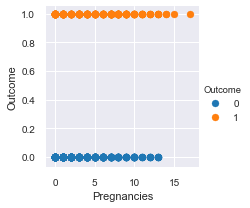

In [20]:
sns.set_style("darkgrid")
sns.FacetGrid(df, hue="Outcome", )\
    .map(plt.scatter, "Pregnancies", "Outcome")\
    .add_legend()
plt.show()

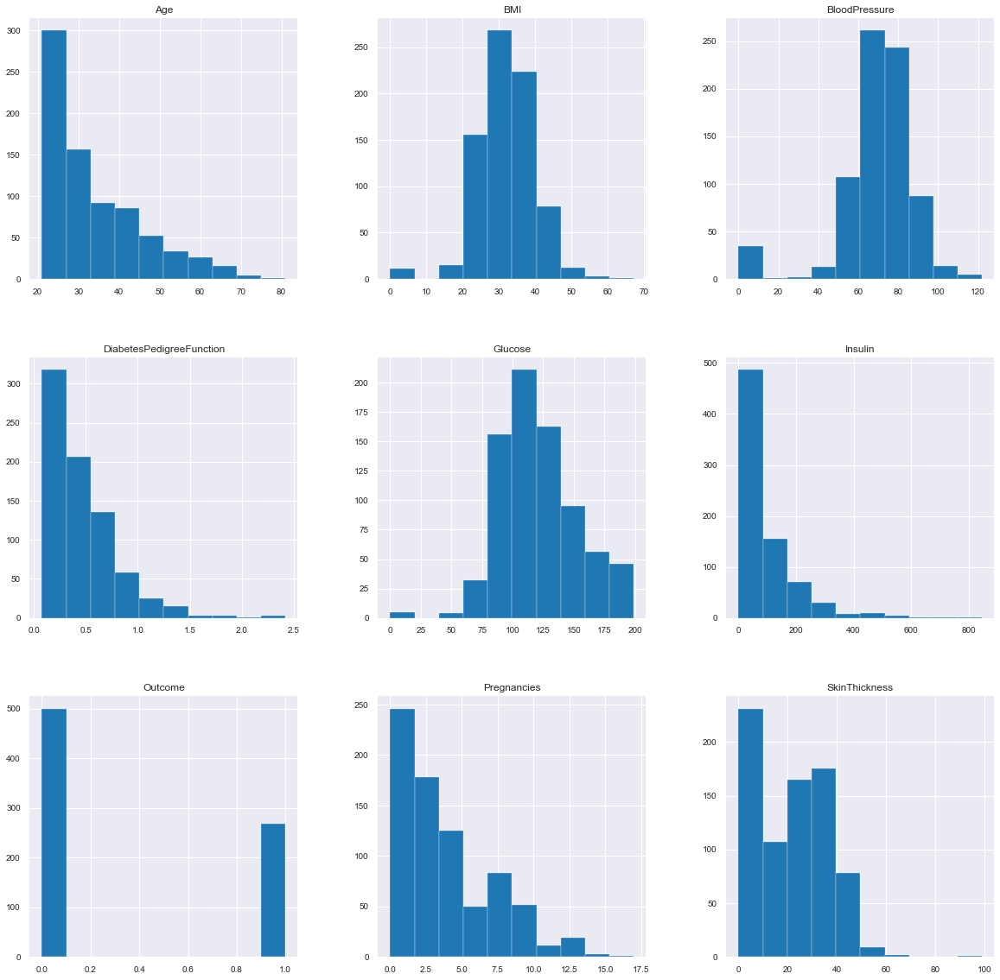

In [21]:
diabetes.hist(figsize=(20,20));

# Basic Analytics

Create a regression plot to model the relationship between `glucose` and `insulin`

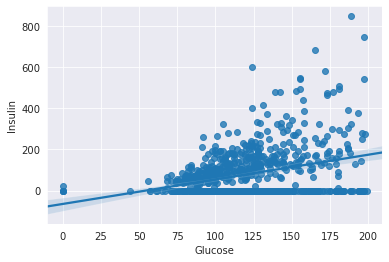

In [20]:
sns.regplot(x=diabetes['Glucose'], y=diabetes['Insulin']);

The same plot with a few small variations so illistrate there are a number of ways to accomplish similar tasks

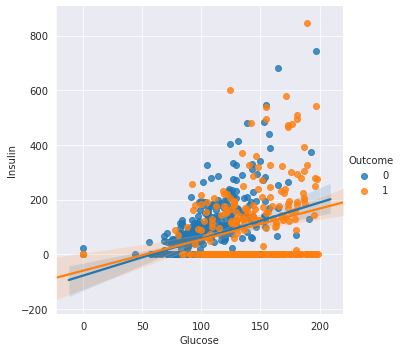

In [22]:
sns.lmplot(x="Glucose", y="Insulin", hue="Outcome", data=diabetes);

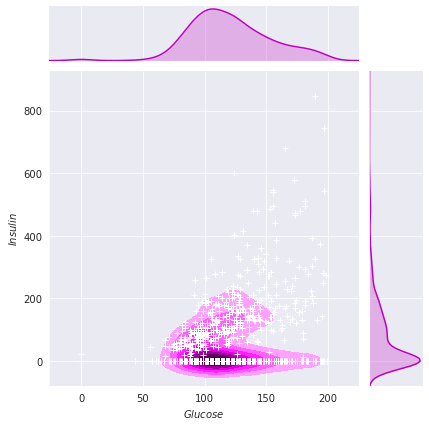

In [23]:
g = sns.jointplot(x="Glucose", y="Insulin", data=diabetes, kind="kde", color="m")
g.plot_joint(plt.scatter, c="w", s=30, linewidth=1, marker="+")
g.ax_joint.collections[0].set_alpha(0)
g.set_axis_labels("$Glucose$", "$Insulin$");

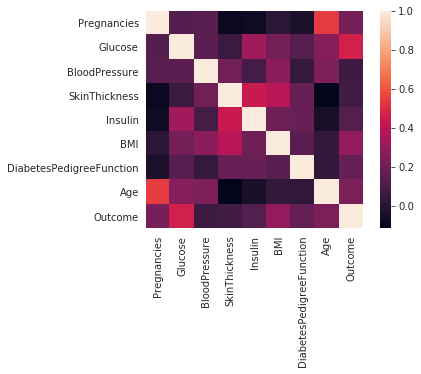

In [27]:
sns.heatmap(diabetes.corr(),square=True);

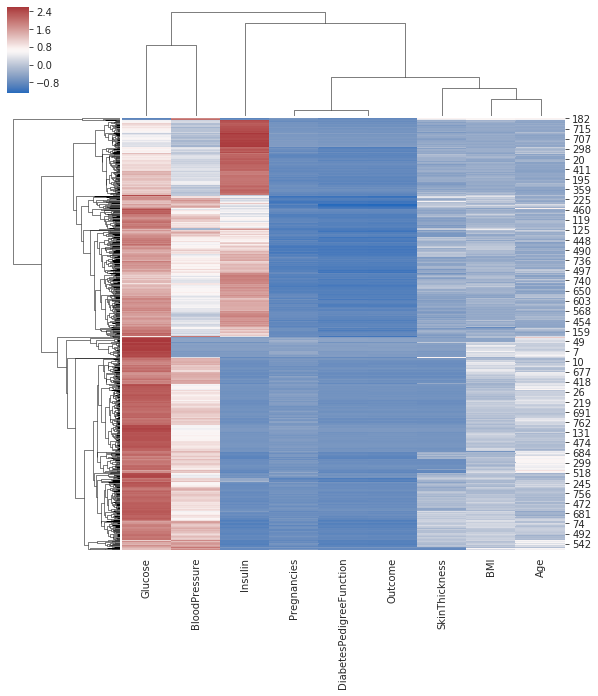

In [36]:
sns.clustermap(diabetes, z_score=0, cmap="vlag");